In [3]:
# ----------------------------------------------------------------------------
#
# TITLE - potential_fitting.ipynb
# AUTHOR - James Lane
# PROJECT - AST 1501
#
# ----------------------------------------------------------------------------
#
# Docstrings and metadata:
'''Fit the Kuijken & Tremaine model to the MWPotential2014 + triaxial halo model.
'''

__author__ = "James Lane"

In [4]:
### Imports

## Basic
import numpy as np
import sys, os, pdb

## Plotting
from matplotlib import pyplot as plt

## galpy
from galpy import potential

## Fitting
from scipy.optimize import curve_fit

## Project specific
sys.path.append('../../src/')
import ast1501.potential

In [5]:
# Matplotlib for notebooks
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# Meta

## Future work

## Information
- Kuijken & Tremaine model: https://ui.adsabs.harvard.edu/#abs/1994ApJ...421..178K/abstract

# Define functions

In [26]:
def kuijken_model(x,vc,alpha,psi0,p):
    
    if alpha != 0:
        axi_component = ( vc**2 / ( 2 * alpha ) ) * ( x[0] / 8 )**( 2 * alpha )
    else:
        axi_component = ( vc**2 ) * np.log( x[0] )
    ##ie
    
    nonaxi_component = ( psi0*( x[0] / 8 )**(p) ) * ( np.cos( 2*( x[1] ) ) )
    
    return axi_component + nonaxi_component
#def

# Make the data to fit
Make MWPotential2014 and replace the normal halo with the triaxial halo

In [27]:
# First declare the data space. Fit a grid from 5-15 kpc in radius and -pi to pi in azimuth
R_limits = [5,15]
phi_limits = [-np.pi,np.pi]
R_range = np.linspace( R_limits[0], R_limits[1], 100 )
phi_range = np.linspace( phi_limits[0], phi_limits[1], 100 )
R_mesh, phi_mesh = np.meshgrid( R_range, phi_range )
mesh_size = R_mesh.shape

# Make into a 2D array that can be fed into the function
Rs = R_mesh.flatten()
phis = phi_mesh.flatten()
xdata = np.vstack((Rs,phis))

In [28]:
# Make the galpy data
mwpot_trihalo = ast1501.potential.make_MWPotential2014_triaxialNFW(halo_b=1.1)

pot = np.zeros_like(Rs)
for i in range( len(pot) ):
    pot[i] = potential.evaluatePotentials( mwpot_trihalo, R=Rs[i], z=0, phi=phis[i] ).value
###i

pot_inf = potential.evaluatePotentials( mwpot_trihalo, R=100000, z=0, phi=0 ).value
pot -= pot_inf

# Example fit

In [29]:
# Now fit
popt, pcov = curve_fit(kuijken_model, xdata, pot, p0=[220,-1.5,1000,-0.5] )

In [30]:
variables = ['vc','alpha','psi0','p']
for i in range(len(popt)):
    print( variables[i] + ': ' + str(popt[i]) )
###i

print('\n\n')
print(pcov)

vc: 175.113925799148
alpha: -0.27481327084398166
psi0: 380.4511885662967
p: -0.4647332204925791



[[ 7.68103341e-04 -2.26127225e-06  6.42377679e-04 -1.31000090e-05]
 [-2.26127225e-06  6.85003277e-09 -1.11879879e-06  3.95003451e-08]
 [ 6.42377679e-04 -1.11879879e-06  1.83285162e+01 -3.64583157e-02]
 [-1.31000090e-05  3.95003451e-08 -3.64583157e-02  1.15181776e-03]]


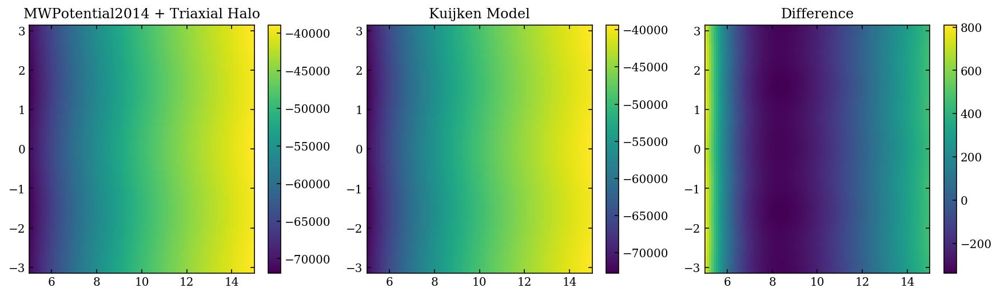

In [11]:
fig = plt.figure( figsize=(15,4) )

plt.subplot(1, 3, 1)
plt.title("MWPotential2014 + Triaxial Halo")
plt.pcolormesh(R_mesh, phi_mesh, pot.reshape(mesh_size) )
plt.axis( [ R_limits[0], R_limits[1], phi_limits[0], phi_limits[1] ] )
plt.colorbar()

plt.subplot(1, 3, 2)
plt.title("Kuijken Model")
plt.pcolormesh( R_mesh, phi_mesh, kuijken_model(xdata, *popt).reshape(mesh_size) )
plt.axis( [ R_limits[0], R_limits[1], phi_limits[0], phi_limits[1] ] )
plt.colorbar()

plt.subplot(1, 3, 3)
plt.title("Difference")
plt.pcolormesh( R_mesh, phi_mesh, pot.reshape(mesh_size) - kuijken_model(xdata, *popt).reshape(mesh_size) )
plt.axis( [ R_limits[0], R_limits[1], phi_limits[0], phi_limits[1] ] )
plt.colorbar()

pass;

# Fit a range of b

In [12]:
b_values = np.linspace( 0.7, 1.3, num=14, endpoint=True )
n_bs = len(b_values)
n_variables = 4
variable_storage = np.zeros( ( n_bs, n_variables ) )
variable_names = [r'$v_{c} [km/s]$',r'$\alpha$',r'$\psi_{0}$ [km$^{2}$/s$^{2}$]',r'$p$']

[ 1.51334135e+02 -2.92349242e-01 -8.86814091e+02 -5.29835187e-01]
[ 1.54541180e+02 -2.89912349e-01 -7.81411219e+02 -5.21895626e-01]
[ 1.57607961e+02 -2.87616754e-01 -6.63237473e+02 -5.14161098e-01]
[ 1.60544537e+02 -2.85443110e-01 -5.33350383e+02 -5.06648072e-01]
[ 1.63359911e+02 -2.83375801e-01 -3.92730874e+02 -4.99407988e-01]
[ 166.06217941   -0.28140207 -242.28764141   -0.49264261]
[168.65865481  -0.2795114  -82.86107979  -0.48811123]
[171.15596465  -0.27769501  84.76542277  -0.47261772]
[173.56014292  -0.27594554 259.88077277  -0.46878137]
[ 1.75876693e+02 -2.74256727e-01  4.41814476e+02 -4.62641576e-01]
[ 1.78110653e+02 -2.72623234e-01  6.29952083e+02 -4.56302099e-01]
[ 1.80266651e+02 -2.71040462e-01  8.23725013e+02 -4.49983727e-01]
[ 1.82348944e+02 -2.69504429e-01  1.02260748e+03 -4.43742551e-01]
[ 1.84361461e+02 -2.68011661e-01  1.22611327e+03 -4.37597479e-01]


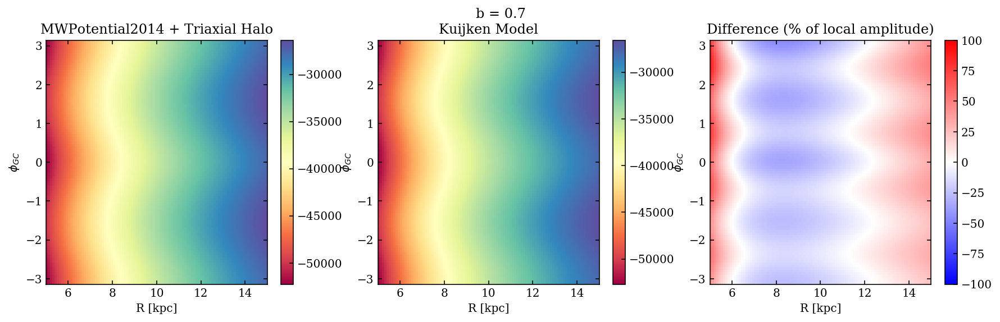

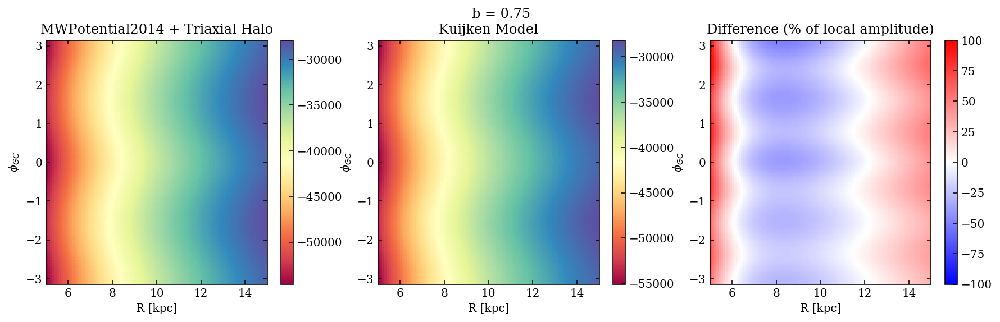

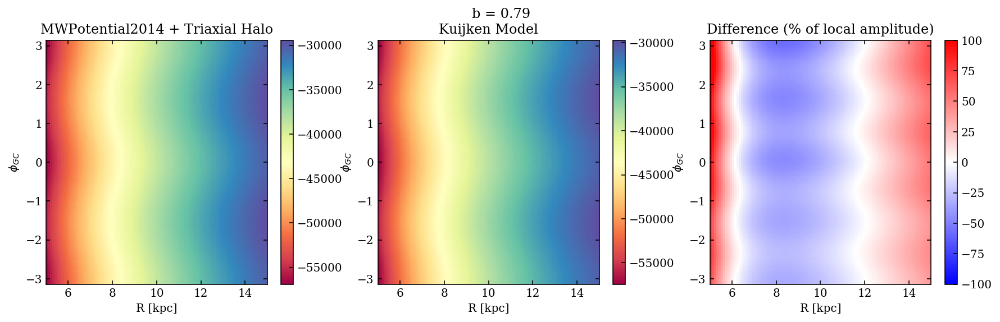

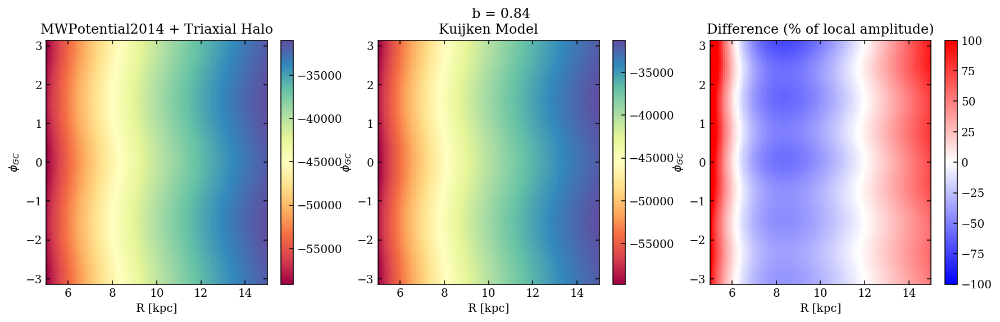

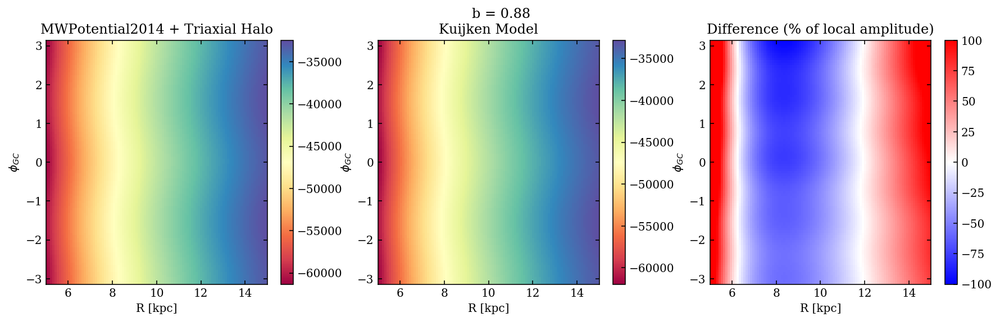

...

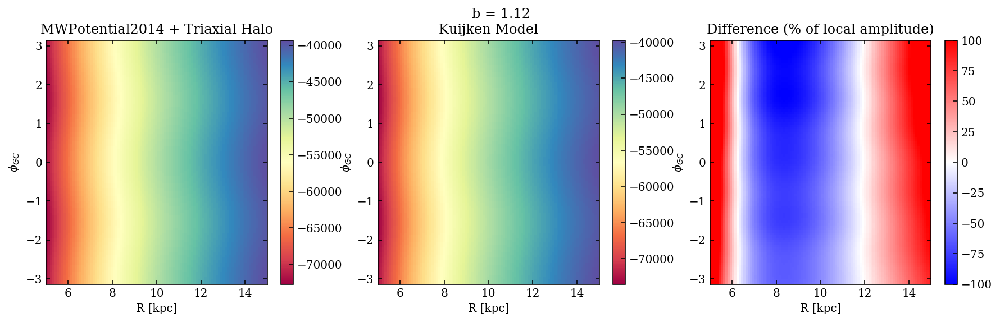

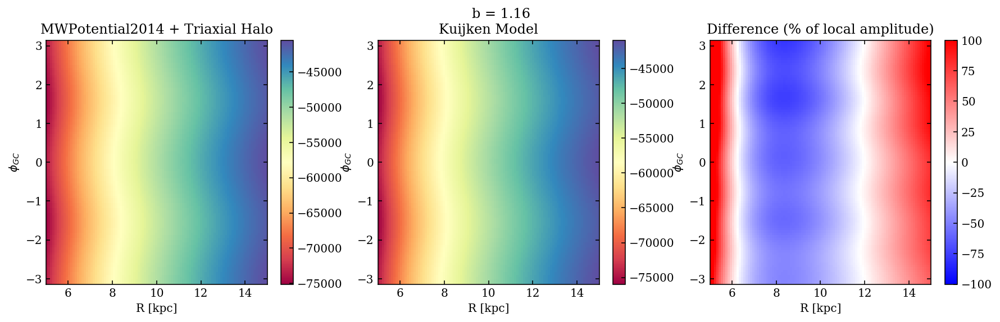

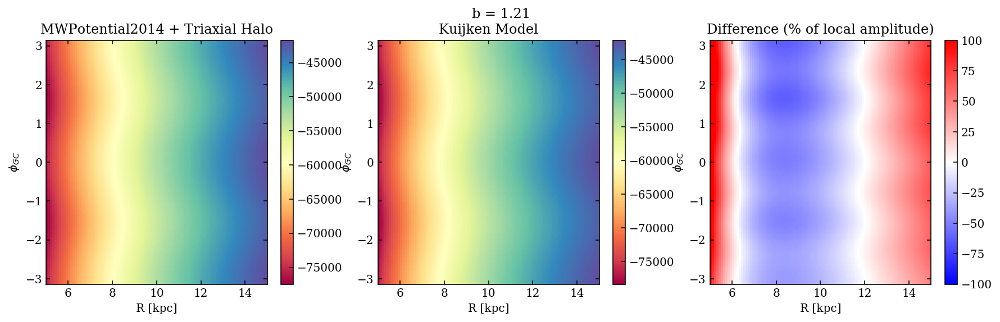

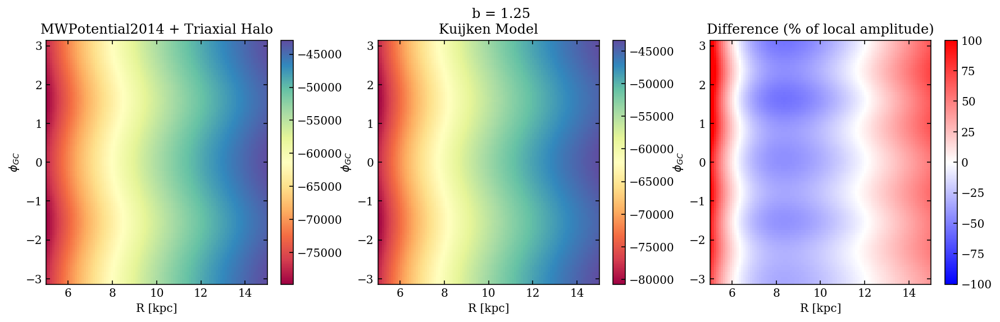

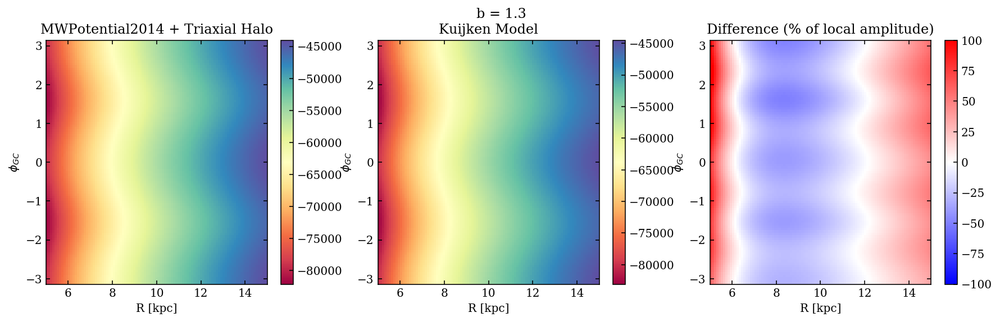

In [32]:
for i in range( n_bs ):
    
    # Make the galpy data
    mwpot_trihalo = ast1501.potential.make_MWPotential2014_triaxialNFW(halo_b=b_values[i])
    pot = np.zeros_like(Rs)
    for j in range( len(pot) ):
        pot[j] = potential.evaluatePotentials( mwpot_trihalo, R=Rs[j], z=0, phi=phis[j] ).value
    ###i
    pot_inf = potential.evaluatePotentials( mwpot_trihalo, R=100000, z=0, phi=0 ).value
    pot -= pot_inf
    
    # Now fit
    popt, pcov = curve_fit(kuijken_model, xdata, pot, p0=[220,-1.5,1000,-0.5] )
    
    # Store the output
    print(popt)
    variable_storage[i,:] = popt
    
    # Now plot
    fig = plt.figure( figsize=(15,4) )

    plt.subplot(1, 3, 1)
    plt.title("MWPotential2014 + Triaxial Halo")
    plt.pcolormesh(R_mesh, phi_mesh, pot.reshape(mesh_size), cmap='Spectral')
    plt.axis( [ R_limits[0], R_limits[1], phi_limits[0], phi_limits[1] ] )
    plt.xlabel('R [kpc]')
    plt.ylabel(r'$\phi_{GC}$')
    plt.colorbar()

    plt.subplot(1, 3, 2)
    plt.title("Kuijken Model")
    plt.pcolormesh( R_mesh, phi_mesh, kuijken_model(xdata, *popt).reshape(mesh_size), cmap='Spectral' )
    plt.axis( [ R_limits[0], R_limits[1], phi_limits[0], phi_limits[1] ] )
    plt.xlabel('R [kpc]')
    plt.ylabel(r'$\phi_{GC}$')
    plt.colorbar()

    plt.subplot(1, 3, 3)
    plt.title("Difference (% of local amplitude)")
    pot_Ravg_sub = pot.reshape(mesh_size) - np.mean( pot.reshape(mesh_size), 0 ) # Average of each R is subtracted
    pot_Ravg_sub_max = np.amax( pot_Ravg_sub, axis=0 )
    pot_Ravg_sub_max_grid = np.repeat( pot_Ravg_sub_max[:, np.newaxis], pot_Ravg_sub_max.shape[0], axis=1)
    plt.pcolormesh( R_mesh, phi_mesh, 
                   100*np.divide(pot.reshape(mesh_size) - kuijken_model(xdata, *popt).reshape(mesh_size),
                                 pot_Ravg_sub_max_grid), cmap='bwr', vmin=-100, vmax=100 
                  )
    plt.axis( [ R_limits[0], R_limits[1], phi_limits[0], phi_limits[1] ] )
    plt.xlabel('R [kpc]')
    plt.ylabel(r'$\phi_{GC}$')
    plt.colorbar()
    
    plt.suptitle('b = '+str(round(b_values[i],2)) )

    pass;
###i

## Plot the parameter values as a function of b/a

Fit a power law of the form:

$
f(b) = A(b)^{k} + d
$

or 

$
f(b) = A(b-c)^{k} + d
$

A = 296.477
k = 0.182
d = -126.565


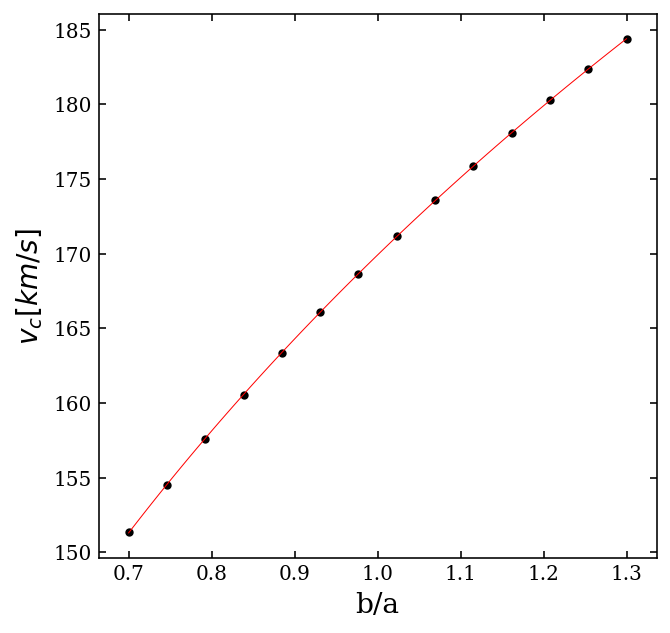

A = 0.279
k = 0.141
d = -0.558


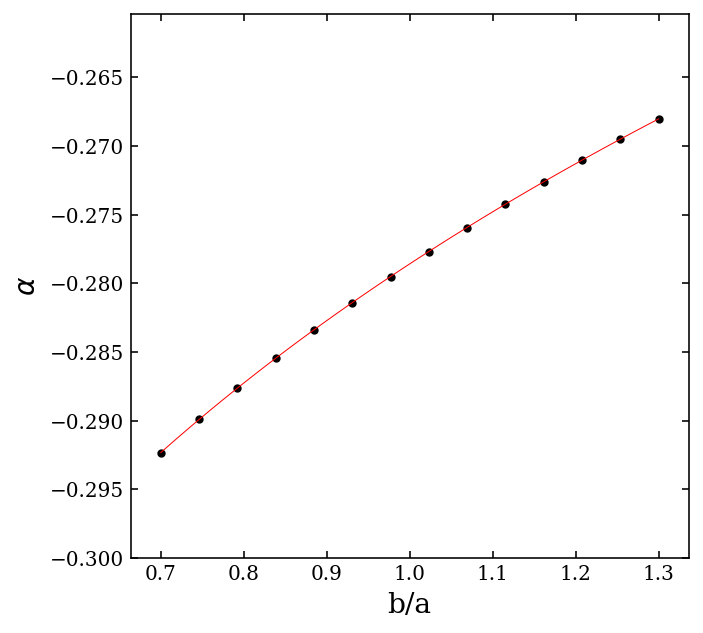

A = 1730.979
k = 2.053
d = -1731.046


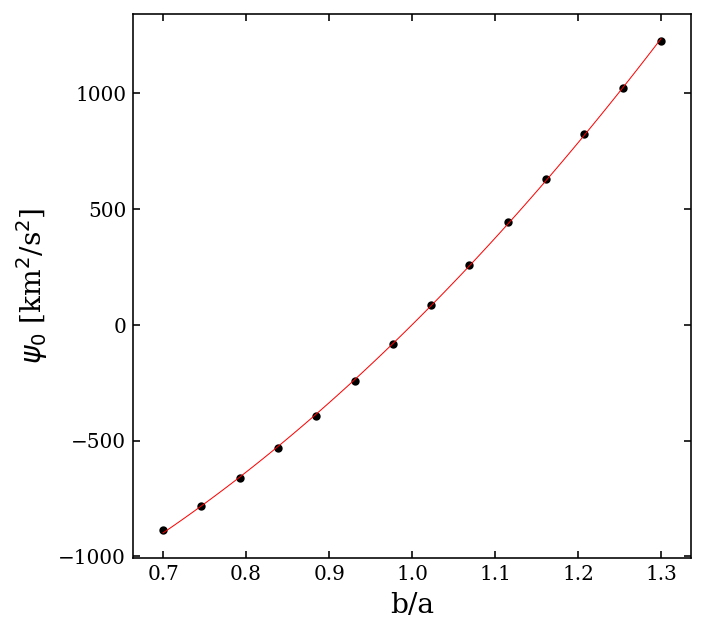

b/a less than 1.0
A = 33.695
c = -0.177
k = 0.003
d = -33.16
b/a greater than 1.0
A = 0.152
c = 0.152
k = 1.169
d = 0.524


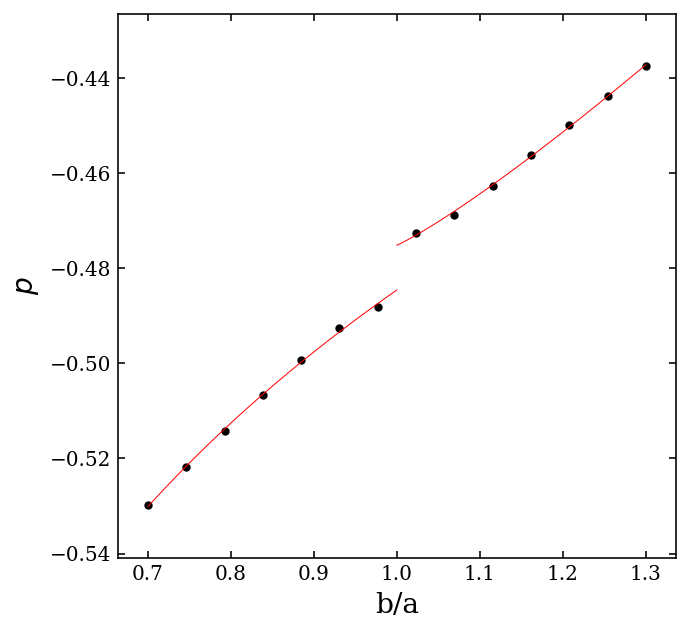

In [14]:
# Now plot the variables

def power_law(x,A,k,d):
    return A*np.power(x,k)+d
#def

def offset_power_law(x,A,c,k,d):
    return A*np.power(x+c,k)+d
#def

def offset_power_law_force(x,A,k,d):
    return A*np.power(x-0.99,k)+d

for i in range( n_variables ):
    
    fig = plt.figure( figsize=(5,5) )
    ax = fig.add_subplot(111)
    
    # Now fit a simple power law
    if i != 3:
        ax.scatter(  b_values, variable_storage[:,i], s=10, color='Black' )
        ax.set_xlabel( 'b/a', fontsize=14 )
        ax.set_ylabel( variable_names[i], fontsize=14 )
        
        popt,pcov = curve_fit( power_law, b_values, variable_storage[:,i], maxfev=10000 )
        fake_x = np.linspace(0.7,1.3,num=100)
        fake_y = power_law(fake_x, *popt)
        ax.plot( fake_x, fake_y, linewidth=0.5, color='Red')
        print('A = '+str(round(popt[0],3)))
        print('k = '+str(round(popt[1],3)))
        print('d = '+str(round(popt[2],3)))
    
    if i == 3:
    
        fit_bounds = ((-np.inf,-0.99,-np.inf,-np.inf),(np.inf,np.inf,np.inf,np.inf))    
        
        ax.scatter(  b_values, variable_storage[:,i], s=10, color='Black' )
        ax.set_xlabel( 'b/a', fontsize=14 )
        ax.set_ylabel( variable_names[i], fontsize=14 )
        
        where_lt_1 = np.where( b_values < 1.0 )[0]
        where_gt_1 = np.where( b_values > 1.0 )[0]
        popt1,pcov1 = curve_fit( offset_power_law, b_values[where_lt_1], 1+variable_storage[where_lt_1,i], 
                                maxfev=10000, bounds=fit_bounds )
        fake_x1 = np.linspace(0.7,1.0,num=100)
        fake_y1 = offset_power_law(fake_x1, *popt1)-1
        ax.plot( fake_x1, fake_y1, linewidth=0.5, color='Red')
        print('b/a less than 1.0')
        print('A = '+str(round(popt1[0],3)))
        print('c = '+str(round(popt1[1],3)))
        print('k = '+str(round(popt1[2],4)))
        print('d = '+str(round(popt1[3],3)))
    
        popt2,pcov2 = curve_fit( offset_power_law_force, b_values[where_gt_1], 1+variable_storage[where_gt_1,i], 
                                maxfev=10000 )
        fake_x2 = np.linspace(1.0,1.3,num=100)
        fake_y2 = offset_power_law_force(fake_x2, *popt2)-1
        ax.plot( fake_x2, fake_y2, linewidth=0.5, color='Red')
        print('b/a greater than 1.0')
        print('A = '+str(round(popt2[0],3)))
        print('c = '+str(round(popt2[0],3)))
        print('k = '+str(round(popt2[1],3)))
        print('d = '+str(round(popt2[2],3)))
    
    plt.show()
    plt.close('all')
###i

pass;

# Fit in radial bins

In [15]:
R_bin_size = 1.0 # kpc
R_bin_cents = np.arange( R_limits[0], R_limits[1], R_bin_size ) + R_bin_size/2
n_Rs = len(R_bin_cents)

b_values = np.linspace( 0.7, 1.3, num=14, endpoint=True )
n_bs = len(b_values)
n_variables = 4
variable_storage = np.zeros( ( n_bs, n_Rs, n_variables ) )
variable_names = [r'$v_{c} [km/s]$',r'$\alpha$',r'$\psi_{0}$ [km$^{2}$/s$^{2}$]',r'$p$']

[ 1.46336125e+02 -2.70136862e-01 -9.25074723e+02 -3.72376420e-01]
[ 1.48215484e+02 -2.78474011e-01 -9.07940367e+02 -4.36210036e-01]
[ 1.49969815e+02 -2.85668004e-01 -9.01563719e+02 -4.87469836e-01]
[ 1.51605345e+02 -2.91942942e-01 -9.01445052e+02 -5.29637191e-01]
[ 1.53132064e+02 -2.97472117e-01 -9.05126129e+02 -5.64994233e-01]
[ 1.54560556e+02 -3.02389118e-01 -9.11172475e+02 -5.95112718e-01]
[ 1.55900818e+02 -3.06797668e-01 -9.18704208e+02 -6.21105768e-01]
[ 1.57161865e+02 -3.10779176e-01 -9.27161322e+02 -6.43788940e-01]
[ 1.58351673e+02 -3.14398304e-01 -9.36175148e+02 -6.63769549e-01]
[ 1.59477237e+02 -3.17707014e-01 -9.45501458e+02 -6.81518807e-01]
[ 1.49239584e+02 -2.67092627e-01 -8.15536267e+02 -3.62153504e-01]
[ 1.51236257e+02 -2.75665449e-01 -8.00259443e+02 -4.26727197e-01]
[ 1.53094057e+02 -2.83052180e-01 -7.94569133e+02 -4.78637143e-01]
[ 1.54821952e+02 -2.89487881e-01 -7.94463678e+02 -5.21371973e-01]
[ 1.56431983e+02 -2.95153392e-01 -7.97754445e+02 -5.57232108e-01]
[ 1.579362

[ 1.87322130e+02 -2.81515618e-01  1.05433037e+03 -5.15566508e-01]
[ 1.89401624e+02 -2.86832362e-01  1.06436408e+03 -5.45466858e-01]
[ 1.91345544e+02 -2.91619699e-01  1.07569949e+03 -5.71686714e-01]
[ 1.93169636e+02 -2.95959335e-01  1.08785312e+03 -5.94886624e-01]
[ 1.94887161e+02 -2.99916647e-01  1.10049327e+03 -6.15569902e-01]
[ 1.75860130e+02 -2.40321142e-01  1.28526149e+03 -2.58479688e-01]
[ 1.79073825e+02 -2.50701271e-01  1.25896567e+03 -3.29129872e-01]
[ 1.82004184e+02 -2.59606092e-01  1.24906372e+03 -3.86646570e-01]
[ 1.84690033e+02 -2.67336031e-01  1.24888651e+03 -4.34476866e-01]
[ 1.87165106e+02 -2.74119196e-01  1.25473106e+03 -4.74942769e-01]
[ 1.89457657e+02 -2.80129371e-01  1.26440392e+03 -5.09667690e-01]
[ 1.91591144e+02 -2.85500368e-01  1.27654044e+03 -5.39823932e-01]
[ 1.93585059e+02 -2.90336561e-01  1.29025986e+03 -5.66282037e-01]
[ 1.95455691e+02 -2.94720435e-01  1.30497499e+03 -5.89699013e-01]
[ 1.97216738e+02 -2.98718009e-01  1.32028669e+03 -6.10583880e-01]


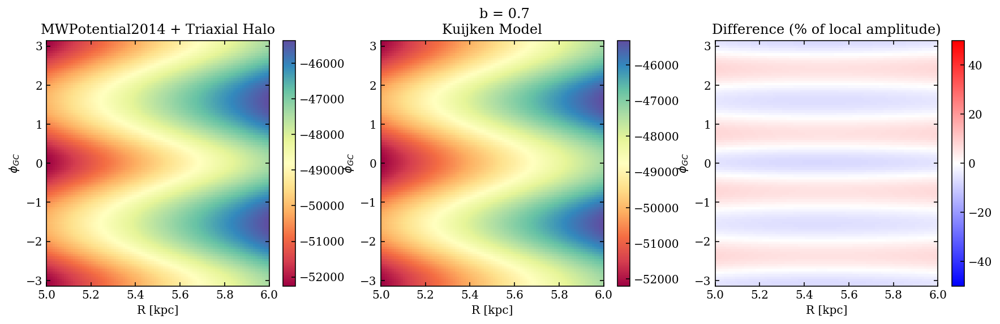

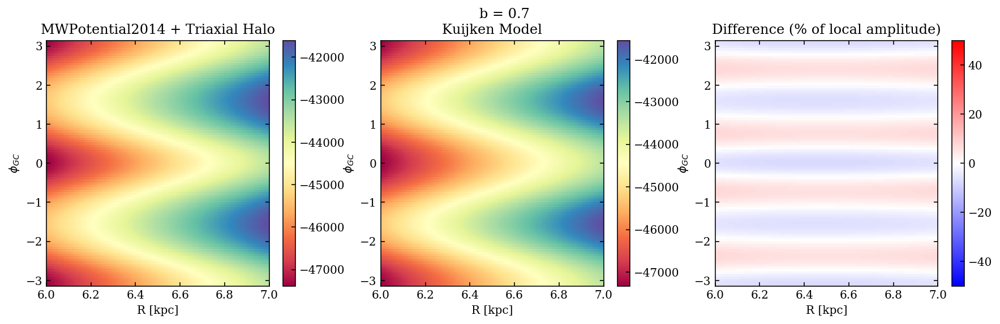

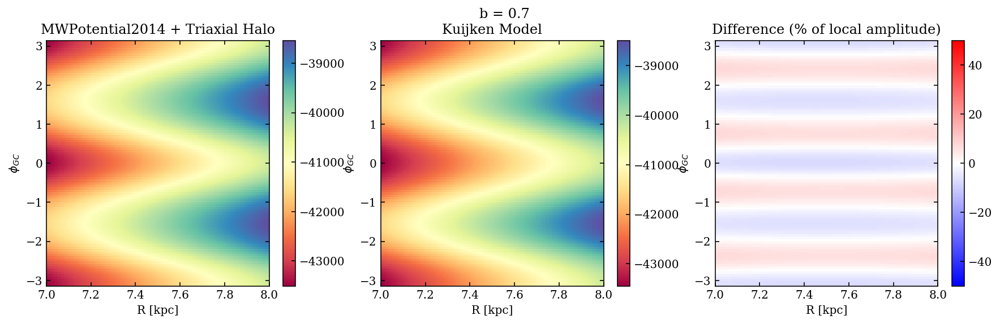

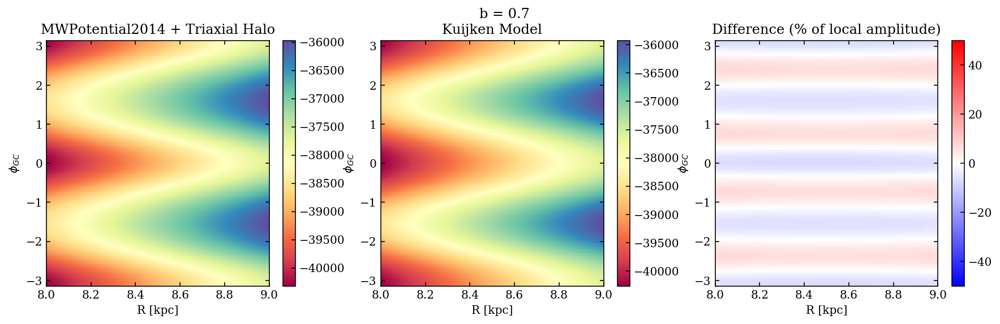

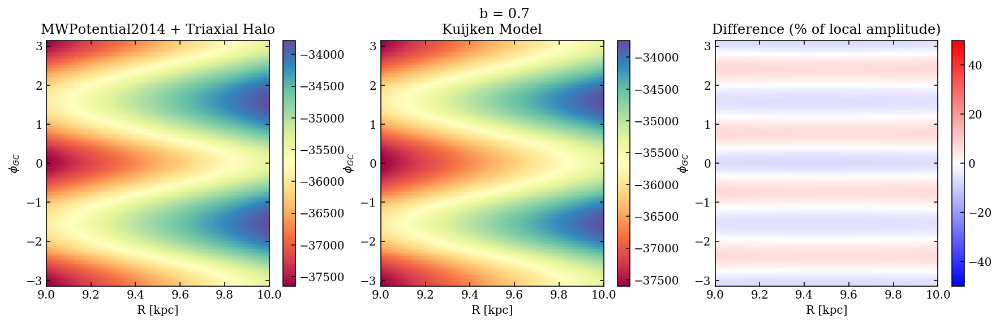

...

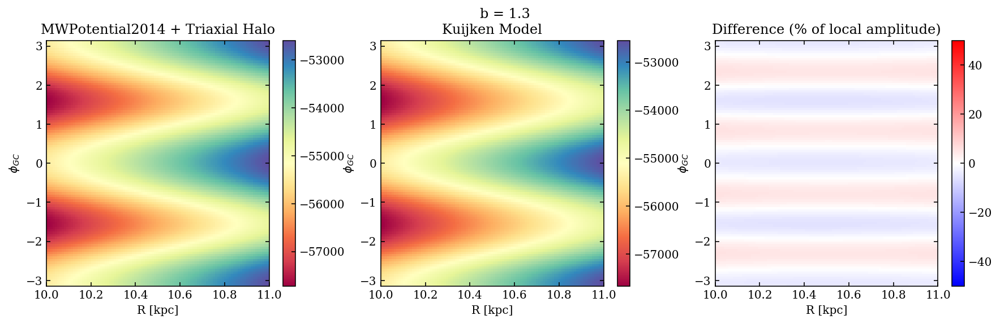

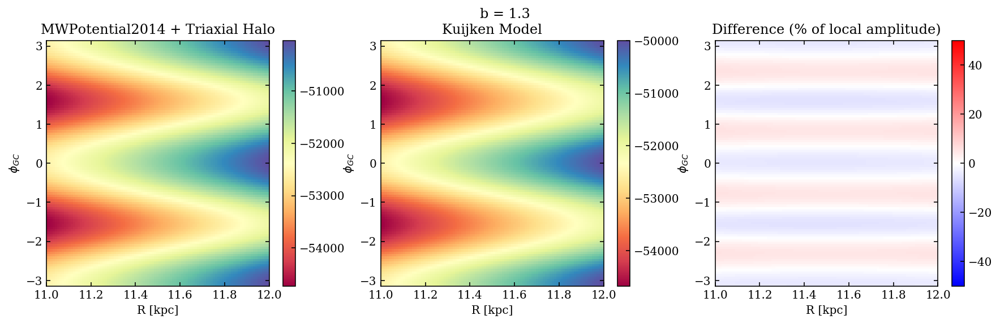

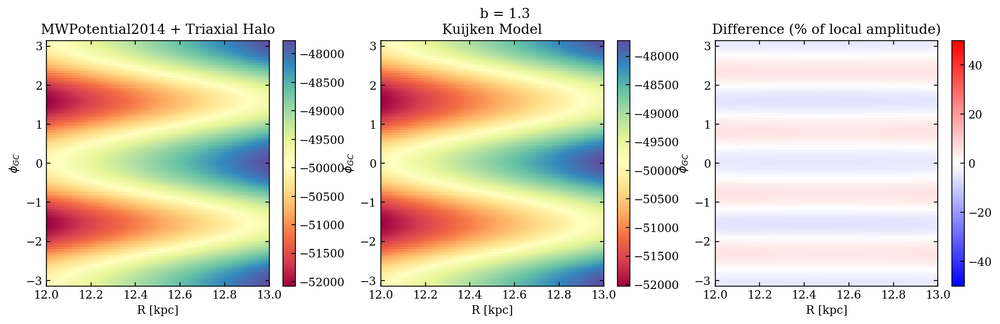

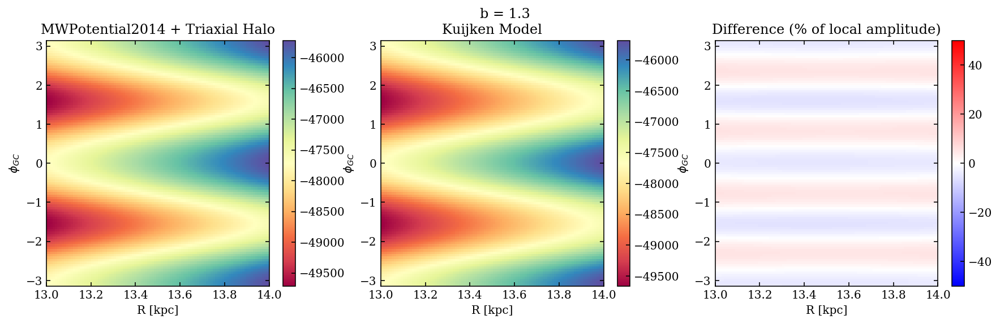

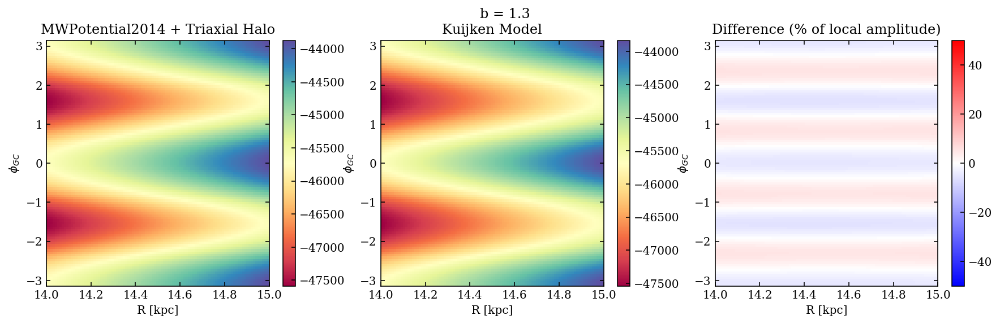

In [16]:
for i in range( n_bs ):
    
    # Make the potential
    mwpot_trihalo = ast1501.potential.make_MWPotential2014_triaxialNFW(halo_b=b_values[i])
    
    for j in range( n_Rs ):
        
        R_hi = R_bin_cents[j]+R_bin_size/2
        R_lo = R_bin_cents[j]-R_bin_size/2
        
        # Make the cutout radial range. Centered on the radial bin
        R_range = np.linspace( R_lo, R_hi, 100 )
        phi_range = np.linspace( phi_limits[0], phi_limits[1], 100 )
        R_mesh, phi_mesh = np.meshgrid( R_range, phi_range )
        mesh_size = R_mesh.shape

        # Make into a 2D array that can be fed into the function
        Rs = R_mesh.flatten()
        phis = phi_mesh.flatten()
        xdata = np.vstack((Rs,phis))
        
        # Make the galpy data
        pot = np.zeros_like(Rs)
        for k in range( len(pot) ):
            pot[k] = potential.evaluatePotentials( mwpot_trihalo, R=Rs[k], z=0, phi=phis[k] ).value
        ###i
        pot_inf = potential.evaluatePotentials( mwpot_trihalo, R=100000, z=0, phi=0 ).value
        pot -= pot_inf

        # Now fit
        popt, pcov = curve_fit(kuijken_model, xdata, pot, p0=[200,-2.8,100,-0.5] )

        # Store the output
        print(popt)
        variable_storage[i,j,:] = popt

        # Now plot
        fig = plt.figure( figsize=(15,4) )

        plt.subplot(1, 3, 1)
        plt.title("MWPotential2014 + Triaxial Halo")
        plt.pcolormesh(R_mesh, phi_mesh, pot.reshape(mesh_size), cmap='Spectral')
        plt.axis( [ R_lo, R_hi, phi_limits[0], phi_limits[1] ] )
        plt.xlabel('R [kpc]')
        plt.ylabel(r'$\phi_{GC}$')
        plt.colorbar()

        plt.subplot(1, 3, 2)
        plt.title("Kuijken Model")
        plt.pcolormesh( R_mesh, phi_mesh, kuijken_model(xdata, *popt).reshape(mesh_size), cmap='Spectral' )
        plt.axis( [ R_lo, R_hi, phi_limits[0], phi_limits[1] ] )
        plt.xlabel('R [kpc]')
        plt.ylabel(r'$\phi_{GC}$')
        plt.colorbar()

        plt.subplot(1, 3, 3)
        plt.title("Difference (% of local amplitude)")
        pot_Ravg_sub = pot.reshape(mesh_size) - np.mean( pot.reshape(mesh_size), 0 ) # Average of each R is subtracted
        pot_Ravg_sub_max = np.amax( pot_Ravg_sub, axis=0 )
        pot_Ravg_sub_max_grid = np.repeat( pot_Ravg_sub_max[:, np.newaxis], pot_Ravg_sub_max.shape[0], axis=1)
        plt.pcolormesh( R_mesh, phi_mesh, 
                       100*np.divide(pot.reshape(mesh_size) - kuijken_model(xdata, *popt).reshape(mesh_size),
                                     pot_Ravg_sub_max_grid), cmap='bwr', vmin=-50, vmax=50 
                      )
        plt.axis( [ R_lo, R_hi, phi_limits[0], phi_limits[1] ] )
        plt.xlabel('R [kpc]')
        plt.ylabel(r'$\phi_{GC}$')
        plt.colorbar()

        plt.suptitle('b = '+str(round(b_values[i],2)) )

        pass;
    ###j
###i

## Make a 2D double power law model

$
f(R,b;A_{1},A_{2},k_{1},k_{2},d) = A_{1}R^{k_{1}} + A_{2}b^{k_{2}} + d
$

In [23]:
def double_power_law_fit(x,A1,A2,k1,k2,d):
    return A1*(x[0]**k1) + A2*(x[1]**k2) + d
#def

def double_power_law(R,b,A1,A2,k1,k2,d):
    return A1*(R**k1) + A2*(b**k2) + d
#def

1 are for R
2 are for b
A1 = 26.9889
A2 = 295.235
k1 = 0.326
k2 = 0.1887
d = -179.2017
[ 2.69889467e+01  2.95235000e+02  3.26001601e-01  1.88714756e-01
 -1.79201675e+02]


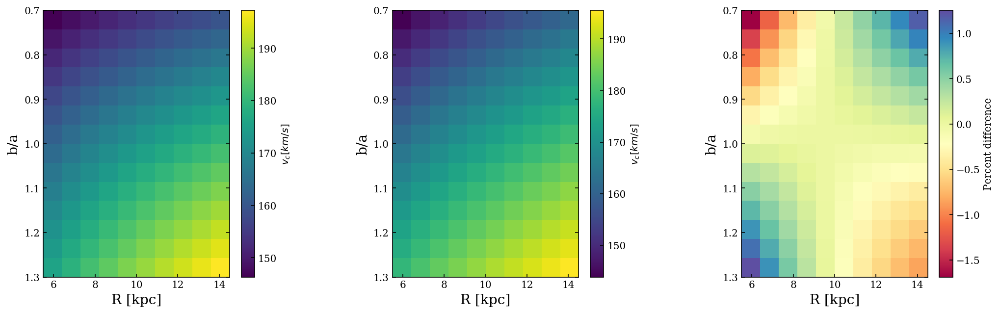

1 are for R
2 are for b
A1 = -149.9844
A2 = 0.2369
k1 = 0.0004
k2 = 0.1606
d = 149.5882
[-1.49984367e+02  2.36875055e-01  3.69210365e-04  1.60606290e-01
  1.49588215e+02]


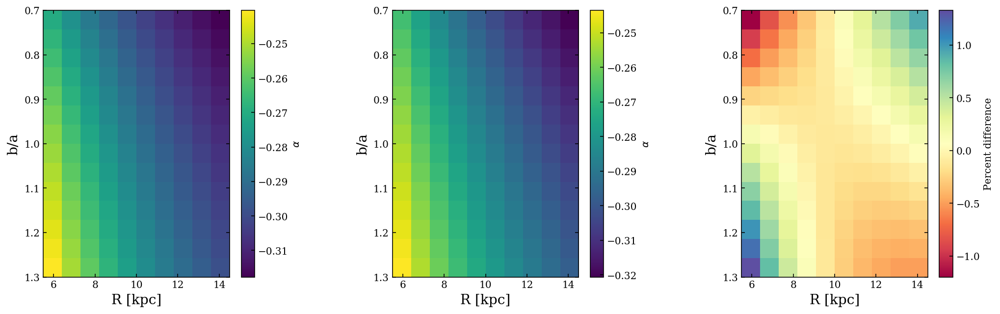

/Users/JamesLane/Software/Python/anaconda3/envs/ast1501-dev/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in power
  

1 are for R
2 are for b
A1 = -1771.5719
A2 = 1783.1187
k1 = -0.002
k2 = 2.0689
d = -19.4272
[-1.77157188e+03  1.78311874e+03 -1.97068863e-03  2.06887401e+00
 -1.94272099e+01]


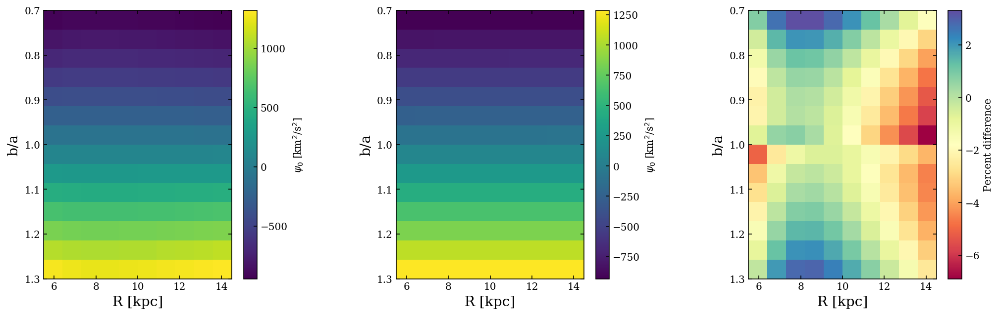

1 are for R
2 are for b
A1 = -955.2859
A2 = 0.2551
k1 = 0.0004
k2 = 0.5811
d = 955.2887
[-9.55285852e+02  2.55131016e-01  3.56811498e-04  5.81101032e-01
  9.55288745e+02]


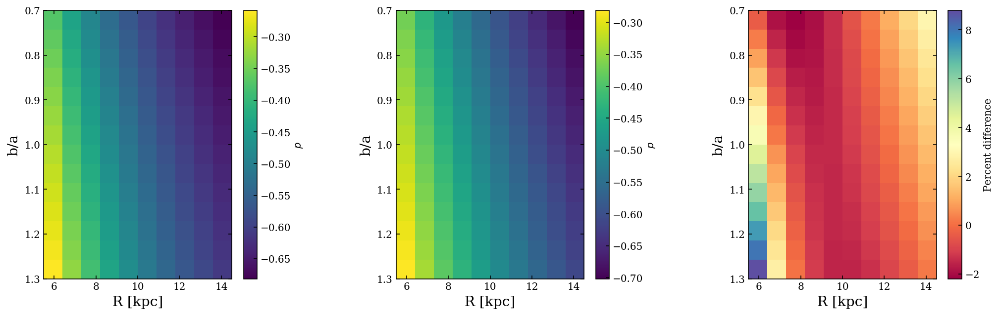

In [18]:
for i in range( n_variables ):
    
    fig = plt.figure( figsize=(17,5) )
    axs = fig.subplots( nrows=1, ncols=3 )
    
    # Now fit a simple power law
    if i < 4:
            
        R_bin_mesh, b_mesh = np.meshgrid(R_bin_cents, b_values)
        fit_mesh_size = R_bin_mesh.shape
        R_bins = R_bin_mesh.flatten()
        bs = b_mesh.flatten()
        fit_data = np.vstack((R_bins,bs))
        
        popt,pcov = curve_fit( double_power_law_fit, fit_data, variable_storage[:,:,i].flatten(), maxfev=10000 )
        fake_z = double_power_law(R_bin_mesh, b_mesh, *popt)
        
        img0 = axs[0].imshow(variable_storage[:,:,i], cmap='viridis', aspect='auto',
                             extent=(np.min(R_bin_cents),np.max(R_bin_cents),np.max(bs),np.min(bs)) )
        axs[0].set_xlabel( 'R [kpc]', fontsize=14 )
        axs[0].set_ylabel( 'b/a', fontsize=14 )
        cbar0 = fig.colorbar(img0, ax=axs[0])
        cbar0.set_label( variable_names[i] )
        
        img1 = axs[1].imshow(fake_z, cmap='viridis', aspect='auto',
                             extent=(np.min(R_bin_cents),np.max(R_bin_cents),np.max(bs),np.min(bs)) )
        axs[1].set_xlabel( 'R [kpc]', fontsize=14 )
        axs[1].set_ylabel( 'b/a', fontsize=14 )
        cbar1 = fig.colorbar(img1, ax=axs[1])
        cbar1.set_label( variable_names[i] )
        
        img2 = axs[2].imshow( 100*np.divide( fake_z-variable_storage[:,:,i], variable_storage[:,:,i] ) , 
                             cmap='Spectral', aspect='auto', 
                             extent=(np.min(R_bin_cents),np.max(R_bin_cents),np.max(bs),np.min(bs)) )
        axs[2].set_xlabel( 'R [kpc]', fontsize=14 )
        axs[2].set_ylabel( 'b/a', fontsize=14 )
        cbar2 = fig.colorbar(img2, ax=axs[2])
        cbar2.set_label( 'Percent difference' )
        
        fig.subplots_adjust(wspace=0.5)
        
        # Print the results
        print('1 are for R')
        print('2 are for b')
        print('A1 = '+str(round(popt[0],4)))
        print('A2 = '+str(round(popt[1],4)))
        print('k1 = '+str(round(popt[2],4)))
        print('k2 = '+str(round(popt[3],4)))
        print('d = '+str(round(popt[4],4)))
        print(popt)
        
    ##fi
    
    plt.show()
    plt.close('all')
###i

## Make a 2D quadratic model

$
f(R,b;A_{1},A_{2},A_{3},A_{4},d) = A_{1}R + A_{2}R^{2} + A_{3}b + A_{4}b^{2} + d
$

In [24]:
def double_quadratic_fit(x,A1,A2,A3,A4,d):
    return A1*x[0] + A2*x[0]**2 + A3*x[1] + A4*x[1]**2 + d
#def

def double_quadratic(R,b,A1,A2,A3,A4,d):
    return A1*R + A2*R**2 + A3*b + A4*b**2 + d
#def

A1 = 3.2969
A2 = -0.0688
A3 = 103.7427
A4 = -23.5743
d = 66.9829
[ 3.29691860e+00 -6.88425545e-02  1.03742747e+02 -2.35742556e+01
  6.69828873e+01]


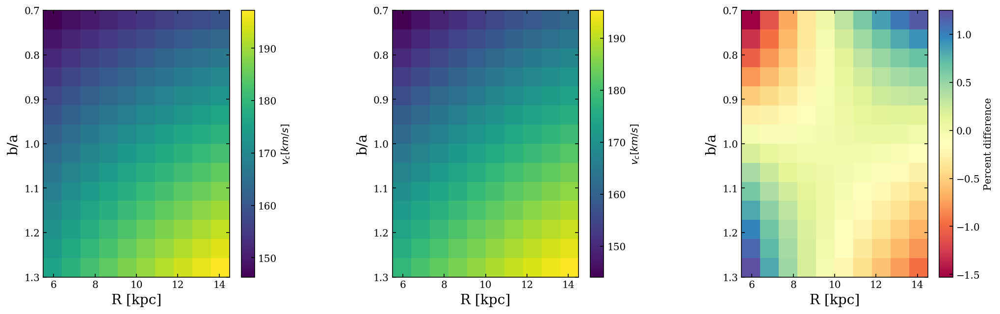

A1 = -0.0128
A2 = 0.0003
A3 = 0.0718
A4 = -0.0165
d = -0.2495
[-0.01276312  0.00034653  0.07176449 -0.01654464 -0.24946015]


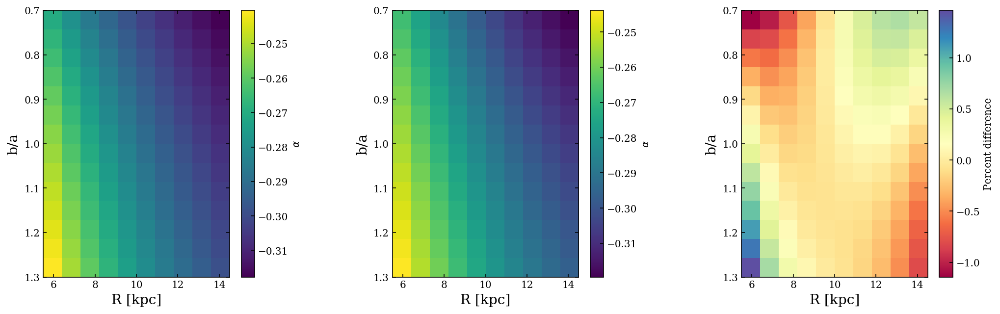

A1 = -2.6536
A2 = 0.1541
A3 = -276.183
A4 = 1983.9343
d = -1698.3661
[-2.65357864e+00  1.54126716e-01 -2.76183009e+02  1.98393433e+03
 -1.69836610e+03]


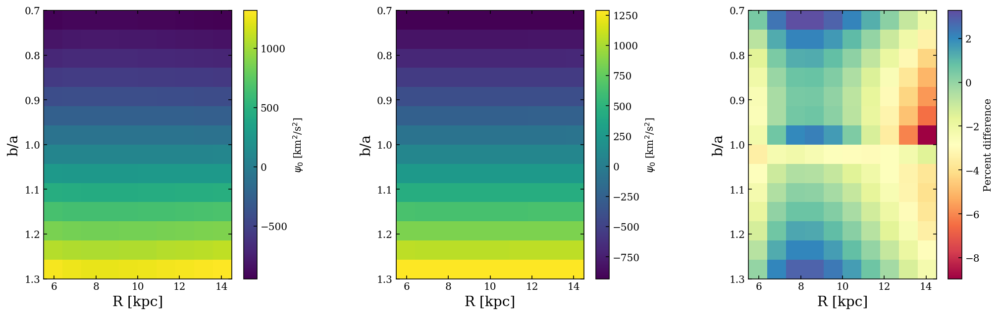

A1 = -0.0915
A2 = 0.0028
A3 = 0.2132
A4 = -0.032
d = -0.0805
[-0.09145756  0.00278964  0.21323965 -0.03202266 -0.08052215]


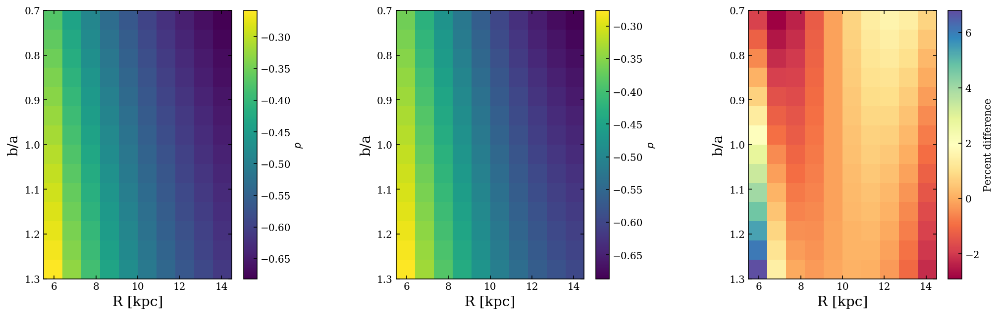

In [25]:
for i in range( n_variables ):
    
    fig = plt.figure( figsize=(17,5) )
    axs = fig.subplots( nrows=1, ncols=3 )
    
    # Now fit a simple power law
    if i < 4:
            
        R_bin_mesh, b_mesh = np.meshgrid(R_bin_cents, b_values)
        fit_mesh_size = R_bin_mesh.shape
        R_bins = R_bin_mesh.flatten()
        bs = b_mesh.flatten()
        fit_data = np.vstack((R_bins,bs))
        
        popt,pcov = curve_fit( double_quadratic_fit, fit_data, variable_storage[:,:,i].flatten(), maxfev=10000 )
        fake_z = double_quadratic(R_bin_mesh, b_mesh, *popt)
        
        img0 = axs[0].imshow(variable_storage[:,:,i], cmap='viridis', aspect='auto',
                             extent=(np.min(R_bin_cents),np.max(R_bin_cents),np.max(bs),np.min(bs)) )
        axs[0].set_xlabel( 'R [kpc]', fontsize=14 )
        axs[0].set_ylabel( 'b/a', fontsize=14 )
        cbar0 = fig.colorbar(img0, ax=axs[0])
        cbar0.set_label( variable_names[i] )
        
        img1 = axs[1].imshow(fake_z, cmap='viridis', aspect='auto',
                             extent=(np.min(R_bin_cents),np.max(R_bin_cents),np.max(bs),np.min(bs)) )
        axs[1].set_xlabel( 'R [kpc]', fontsize=14 )
        axs[1].set_ylabel( 'b/a', fontsize=14 )
        cbar1 = fig.colorbar(img1, ax=axs[1])
        cbar1.set_label( variable_names[i] )
        
        img2 = axs[2].imshow( 100*np.divide( fake_z-variable_storage[:,:,i], variable_storage[:,:,i] ) , 
                             cmap='Spectral', aspect='auto', 
                             extent=(np.min(R_bin_cents),np.max(R_bin_cents),np.max(bs),np.min(bs)) )
        axs[2].set_xlabel( 'R [kpc]', fontsize=14 )
        axs[2].set_ylabel( 'b/a', fontsize=14 )
        cbar2 = fig.colorbar(img2, ax=axs[2])
        cbar2.set_label( 'Percent difference' )
        
        fig.subplots_adjust(wspace=0.5)
        
        # Print the results
        print('A1 = '+str(round(popt[0],4)))
        print('A2 = '+str(round(popt[1],4)))
        print('A3 = '+str(round(popt[2],4)))
        print('A4 = '+str(round(popt[3],4)))
        print('d = '+str(round(popt[4],4)))
        print(popt)
        
    ##fi
    
    plt.show()
    plt.close('all')
###i